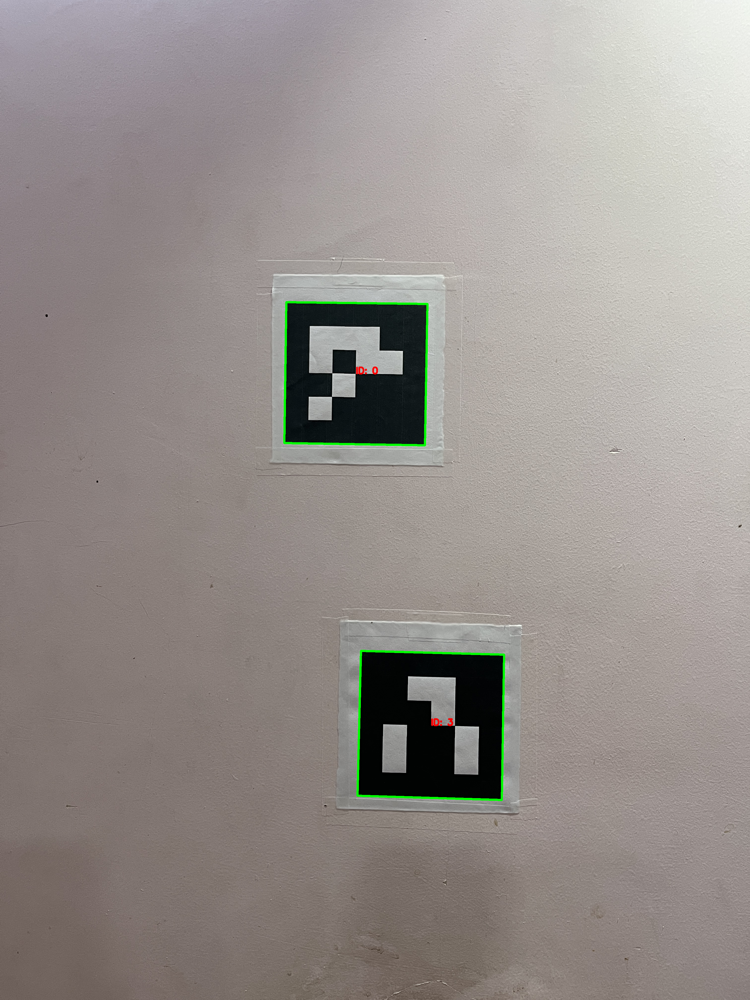

In [3]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load image
image = cv2.imread('/content/test_img_ch2.JPEG')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# STEP 1: Adaptive Thresholding
thresh = cv2.adaptiveThreshold(
    gray, 255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY_INV,
    blockSize=11,
    C=10
)

# STEP 2: Find contours
contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

# STEP 3: Filter small contours
min_contour_area = 100
filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area]

# STEP 4: Approximate polygons and keep quadrilaterals
quadrilaterals = []
for cnt in filtered_contours:
    epsilon = 0.05 * cv2.arcLength(cnt, True)
    approx = cv2.approxPolyDP(cnt, epsilon, True)
    if len(approx) == 4 and cv2.isContourConvex(approx):
        quadrilaterals.append(approx)

# STEP 5: Sort corners in anti-clockwise direction
def order_corners(pts):
    pts = pts.reshape(4, 2)
    rect = np.zeros((4, 2), dtype="float32")
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect

ordered_quads = [order_corners(q) for q in quadrilaterals]

# STEP 6-9: ArUco Detection
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
parameters = cv2.aruco.DetectorParameters()
detector = cv2.aruco.ArucoDetector(aruco_dict, parameters)

corners, ids, _ = detector.detectMarkers(gray)

# Draw markers
output = image.copy()
# Draw markers manually with increased thickness and text size
for i, corner in enumerate(corners):
    pts = corner[0].astype(int)  # shape (4, 2)

    # Draw the marker border
    cv2.polylines(output, [pts], isClosed=True, color=(0, 255, 0), thickness=8)

    # Compute the marker center for placing the ID
    center = np.mean(pts, axis=0).astype(int)

    # Draw the marker ID
    cv2.putText(output, f"ID: {ids[i][0]}", tuple(center),
                cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 255), 5)


# Show images using matplotlib
cv2_imshow(output)

Pixel distance: 1450.17 px
Scale: 0.0167 cm/px
Real-world distance: 24.26 cm


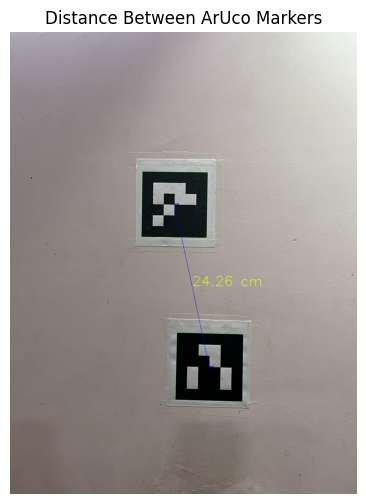

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('/content/test_img_ch2.JPEG')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Known real-world marker size (cm)
marker_size_cm = 9.7

# ArUco setup
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
parameters = cv2.aruco.DetectorParameters()
detector = cv2.aruco.ArucoDetector(aruco_dict, parameters)

# Detect markers
corners, ids, _ = detector.detectMarkers(gray)

output = image.copy()
if ids is not None and len(corners) >= 2:
    cv2.aruco.drawDetectedMarkers(output, corners, ids)

    # Compute scale using first marker's size
    marker_corners = corners[0][0]  # shape (4, 2)

    top = np.linalg.norm(marker_corners[0] - marker_corners[1])
    bottom = np.linalg.norm(marker_corners[2] - marker_corners[3])
    avg_pixel_width = (top + bottom) / 2.0
    scale_cm_per_pixel = marker_size_cm / avg_pixel_width

    # Get centers of first 2 markers
    def marker_center(corner): return np.mean(corner[0], axis=0)

    center1 = marker_center(corners[0])
    center2 = marker_center(corners[1])


    # Compute pixel distance
    pixel_distance = np.linalg.norm(center1 - center2)

    # Convert to real-world distance
    real_distance_cm = pixel_distance * scale_cm_per_pixel

    print(f"Pixel distance: {pixel_distance:.2f} px")
    print(f"Scale: {scale_cm_per_pixel:.4f} cm/px")
    print(f"Real-world distance: {real_distance_cm:.2f} cm")

    # Annotate image
    cv2.line(output, tuple(center1.astype(int)), tuple(center2.astype(int)), (255, 0, 0), 2)
    midpoint = ((center1 + center2) / 2).astype(int)
    cv2.putText(output, f"{real_distance_cm:.2f} cm", tuple(midpoint),
                cv2.FONT_HERSHEY_SIMPLEX, 4, (0, 255, 255), 3)

    # Show image
    output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(output_rgb)
    plt.title("Distance Between ArUco Markers")
    plt.axis('off')
    plt.show()

else:
    print(" Need at least two ArUco markers detected.")


Scale: 0.0173 cm/px
Markers 3 & 11: 31.36 cm (pixel dist: 1807.65)
Markers 3 & 0: 24.25 cm (pixel dist: 1397.69)
Markers 11 & 0: 27.92 cm (pixel dist: 1609.52)


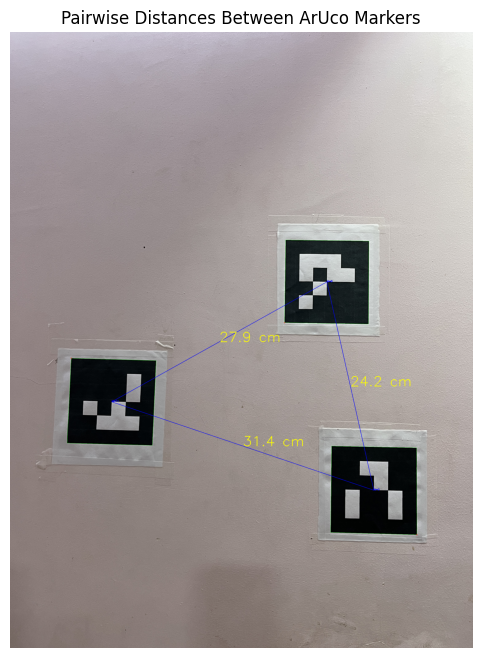

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

image = cv2.imread('/content/IMG_3144.JPEG')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

marker_size_cm = 9.7

# ArUco setup
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_50)
parameters = cv2.aruco.DetectorParameters()
detector = cv2.aruco.ArucoDetector(aruco_dict, parameters)

# Detect markers
corners, ids, _ = detector.detectMarkers(gray)

output = image.copy()
if ids is not None and len(corners) >= 2:
    cv2.aruco.drawDetectedMarkers(output, corners, ids)

    # Compute scale using the first detected marker
    marker_corners = corners[0][0]  # shape (4, 2)
    top = np.linalg.norm(marker_corners[0] - marker_corners[1])
    bottom = np.linalg.norm(marker_corners[2] - marker_corners[3])
    avg_pixel_width = (top + bottom) / 2.0
    scale_cm_per_pixel = marker_size_cm / avg_pixel_width

    print(f"Scale: {scale_cm_per_pixel:.4f} cm/px")

    # Compute centers of all markers
    centers = [np.mean(corner[0], axis=0) for corner in corners]

    # Draw lines and compute distances between all marker pairs
    for (i, j) in combinations(range(len(centers)), 2):
        center1, center2 = centers[i], centers[j]
        pixel_distance = np.linalg.norm(center1 - center2)
        real_distance_cm = pixel_distance * scale_cm_per_pixel

        print(f"Markers {ids[i][0]} & {ids[j][0]}: "
              f"{real_distance_cm:.2f} cm (pixel dist: {pixel_distance:.2f})")

        # Draw line
        pt1, pt2 = tuple(center1.astype(int)), tuple(center2.astype(int))
        cv2.line(output, pt1, pt2, (255, 0, 0), 2)

        # Label midpoint
        midpoint = ((center1 + center2) / 2).astype(int)
        cv2.putText(output, f"{real_distance_cm:.1f} cm", tuple(midpoint),
                    cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 255), 3)

    # Display the result
    output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8))
    plt.imshow(output_rgb)
    plt.title("Pairwise Distances Between ArUco Markers")
    plt.axis('off')
    plt.show()

else:
    print("Need at least two ArUco markers detected.")